# Movie Dataset Analysis, Cleaning and Correlation Study
**Objective**: 

This project focuses on analyzing and cleaning a movie dataset using Python to prepare it for correlation analysis. 

In [86]:
# Import Libraries

import pandas as pd
import seaborn as sns
import numpy as np

import matplotlib
import matplotlib.pyplot as plt
plt.style.use('ggplot')
from matplotlib.pyplot import figure

%matplotlib inline
matplotlib.rcParams['figure.figsize'] = (12,8) # Adjusts the configuration of the plots we will create

# Read data from file

df = pd.read_csv(r'C:\Users\Kyle\Desktop\movies.csv')


In [87]:
# peek at data 

df.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.4,927000.0,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000.0,46998772.0,Warner Bros.,146.0
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.8,65000.0,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000.0,58853106.0,Columbia Pictures,104.0
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.7,1200000.0,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000.0,538375067.0,Lucasfilm,124.0
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.7,221000.0,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000.0,83453539.0,Paramount Pictures,88.0
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.3,108000.0,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000.0,39846344.0,Orion Pictures,98.0


### Checking for Missing Data
This step identifies the percentage of missing values in each column of the dataset. It helps guide decisions on whether to clean, fill, or drop incomplete rows or columns.


In [88]:
# check if there is missing data

for col in df.columns:
    pct_missing = np.mean(df[col].isnull())
    print('{} - {}%'.format(col, pct_missing))

name - 0.0%
rating - 0.010041731872717789%
genre - 0.0%
year - 0.0%
released - 0.0002608242044861763%
score - 0.0003912363067292645%
votes - 0.0003912363067292645%
director - 0.0%
writer - 0.0003912363067292645%
star - 0.00013041210224308815%
country - 0.0003912363067292645%
budget - 0.2831246739697444%
gross - 0.02464788732394366%
company - 0.002217005738132499%
runtime - 0.0005216484089723526%


#### Handling Missing Data
Rather than filling in missing values with statistical estimates (e.g., median or mean), which could introduce bias or distort the true distribution, we opt to remove rows with missing values. This approach ensures that:
- All retained data points are complete and reliable.
- The results of correlation and regression analyses are based on actual, observed values.
- The integrity of financial comparisons remains intact, without relying on potentially misleading imputations.
While this does reduce the dataset size slightly, it improves the quality and trustworthiness of the remaining data.

In [89]:
# remove all rows with any missing values
df.dropna(inplace=True)
for col in df.columns:
    pct_missing = np.mean(df[col].isnull())
    print('{} - {}%'.format(col, pct_missing))

name - 0.0%
rating - 0.0%
genre - 0.0%
year - 0.0%
released - 0.0%
score - 0.0%
votes - 0.0%
director - 0.0%
writer - 0.0%
star - 0.0%
country - 0.0%
budget - 0.0%
gross - 0.0%
company - 0.0%
runtime - 0.0%


### Data Cleaning

#### Data Quality Observation: Year and Release Date Mismatch
During the initial inspection of the dataset, an inconsistency was identified between the year and released columns. Specifically, the year column is intended to reflect the movie's release year, but in some cases, it does not match the actual year derived from the released column.

This indicates that the year column may have been incorrectly recorded or derived using an unreliable source.

We corrected inconsistencies between the year and released columns by extracting the actual release year from the released dates. This involved removing country information, converting the cleaned dates to datetime format, and then updating the year column with the extracted year values. Missing or invalid entries were filled with 0 to allow proper conversion to integers. This ensures the year column accurately reflects the true release year for each movie.

In [90]:
# --- Clean and Standardize the 'year' Column Using 'released' ---

# Ensure 'released' is a string to enable string operations
df['released'] = df['released'].astype(str)

# Extract the date portion by removing country info (e.g., "June 13, 1980 (United States)" → "June 13, 1980")
df['released_clean'] = df['released'].apply(lambda x: x.split(' (')[0])

# Convert cleaned release date to datetime format
df['released_clean'] = pd.to_datetime(df['released_clean'], format='%B %d, %Y', errors='coerce')

# Extract the release year from the datetime column
df['correct_year'] = df['released_clean'].dt.year

# Update the 'year' column with the corrected year
# Fill missing values with 0 before converting to integer
df['year'] = df['correct_year'].fillna(0).astype(int)

# Drop intermediate columns
df.drop(columns=['released_clean', 'correct_year'], inplace=True)

# Preview the updated DataFrame
df.head()


,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.4,927000.0,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000.0,46998772.0,Warner Bros.,146.0
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.8,65000.0,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000.0,58853106.0,Columbia Pictures,104.0
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.7,1200000.0,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000.0,538375067.0,Lucasfilm,124.0
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.7,221000.0,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000.0,83453539.0,Paramount Pictures,88.0
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.3,108000.0,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000.0,39846344.0,Orion Pictures,98.0


In [105]:
# sort the data by gross
df.sort_values(by=['gross'], inplace= False, ascending=False)

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
5445,386,5,0,2009,527,7.8,1100000.0,785,1263,1534,47,237000000.0,2.847246e+09,1382,162.0
7445,388,5,0,2019,137,8.4,903000.0,105,513,1470,47,356000000.0,2.797501e+09,983,181.0
3045,4909,5,6,1997,534,7.8,1100000.0,785,1263,1073,47,200000000.0,2.201647e+09,1382,194.0
6663,3643,5,0,2015,529,7.8,876000.0,768,1806,356,47,245000000.0,2.069522e+09,945,138.0
7244,389,5,0,2018,145,8.4,897000.0,105,513,1470,47,321000000.0,2.048360e+09,983,149.0
7480,4388,4,2,2019,1126,6.9,222000.0,1012,1361,457,47,260000000.0,1.670728e+09,1423,118.0
6653,2117,5,0,2015,1303,7.0,593000.0,335,2523,293,47,150000000.0,1.670516e+09,1397,124.0
6043,3878,5,0,2012,1899,8.0,1300000.0,1060,1646,1470,47,220000000.0,1.518816e+09,983,143.0
6646,1541,5,0,2015,165,7.1,370000.0,809,481,1785,47,190000000.0,1.515341e+09,1397,137.0
7494,1530,4,2,2019,2053,6.8,148000.0,277,1383,1036,47,150000000.0,1.450027e+09,1422,103.0


In [106]:
#drop any duplicates
df.drop_duplicates()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
0,4692,6,6,1980,1304,8.4,927000.0,1795,2832,699,46,19000000.0,4.699877e+07,1426,146.0
1,3929,6,1,1980,1127,5.8,65000.0,1578,1158,214,47,4500000.0,5.885311e+07,452,104.0
2,3641,4,0,1980,1359,8.7,1200000.0,757,1818,1157,47,18000000.0,5.383751e+08,945,124.0
3,204,4,4,1980,1127,7.7,221000.0,889,1413,1474,47,3500000.0,8.345354e+07,1108,88.0
4,732,6,4,1980,1170,7.3,108000.0,719,351,271,47,6000000.0,3.984634e+07,1083,98.0
5,1509,6,9,1980,1922,6.4,123000.0,1758,3081,155,47,550000.0,3.975460e+07,1108,95.0
6,3930,6,0,1980,1359,7.9,188000.0,974,576,860,47,27000000.0,1.152299e+08,1397,133.0
7,3122,6,3,1980,530,8.2,330000.0,1269,1257,1469,47,18000000.0,2.340243e+07,390,129.0
8,3732,4,0,1981,1346,6.8,101000.0,1606,1402,595,47,54000000.0,1.081857e+08,548,127.0
9,4401,6,3,1980,1755,7.0,10000.0,2011,280,402,47,10000000.0,1.579519e+07,1391,100.0


### Finding Correlations in the Data
We compute and visualize the Pearson correlation matrix between all numerical features (e.g., `budget`, `gross`, `votes`, `runtime`, `score`) to identify relationships. Strong correlations may indicate predictive relationships, particularly between budget and revenue.

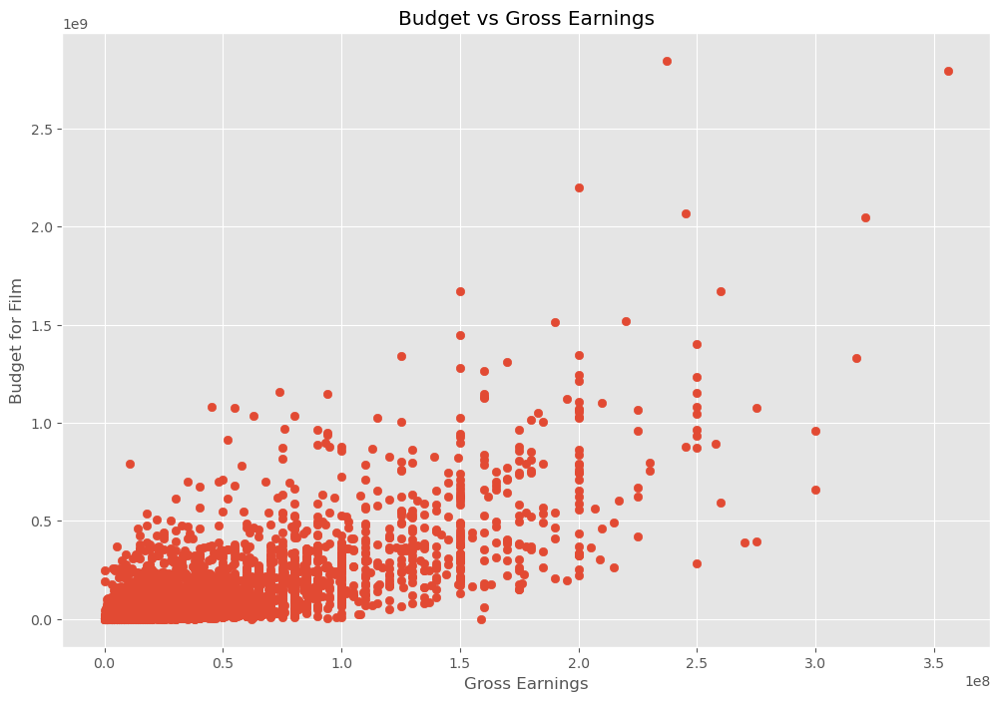

In [93]:
# Scatter plot with budget vs gross revenue

plt.scatter(x=df['budget'],y=df['gross'])

plt.title('Budget vs Gross Earnings')
plt.xlabel('Gross Earnings')
plt.ylabel('Budget for Film')

plt.show()

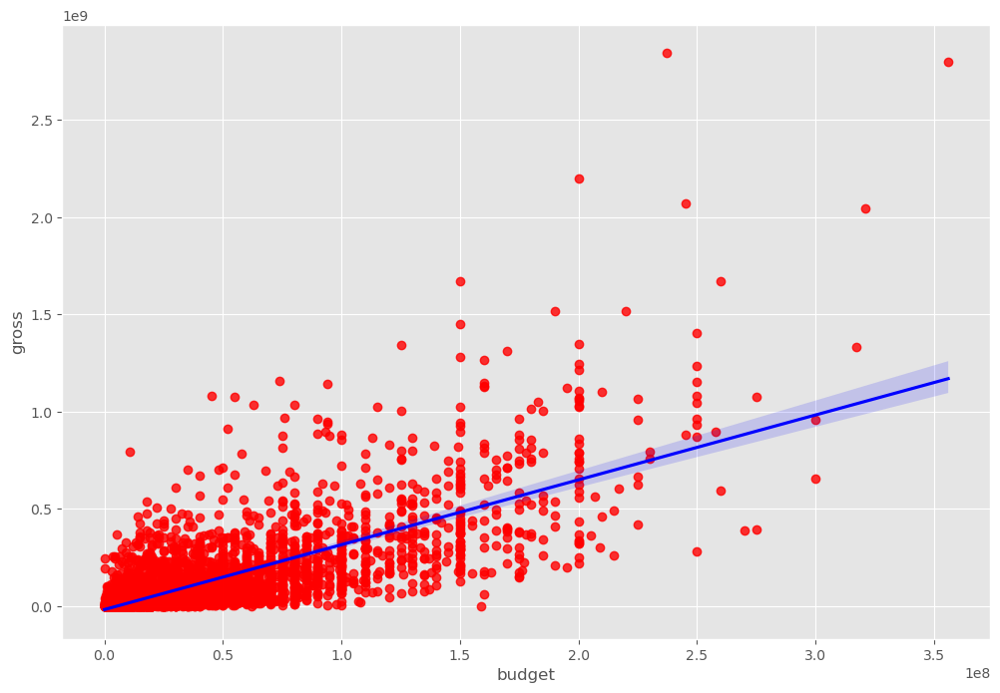

In [94]:
# Plot the budget vs gross using seaborn

sns.regplot(x='budget', y='gross', data=df, scatter_kws={"color" : "red"}, line_kws={"color":"blue"})
plt.show()

In [95]:
# Look at correlation

df.corr(numeric_only=True, method='pearson')

,year,score,votes,budget,gross,runtime
year,1.000000,0.021325,0.050569,0.070251,0.055369,0.025931
score,0.021325,1.000000,0.474256,0.072001,0.222556,0.414068
votes,0.050569,0.474256,1.000000,0.439675,0.614751,0.352303
budget,0.070251,0.072001,0.439675,1.000000,0.740247,0.318695
gross,0.055369,0.222556,0.614751,0.740247,1.000000,0.275796
runtime,0.025931,0.414068,0.352303,0.318695,0.275796,1.000000


In [96]:
# high correlation between budget and gross

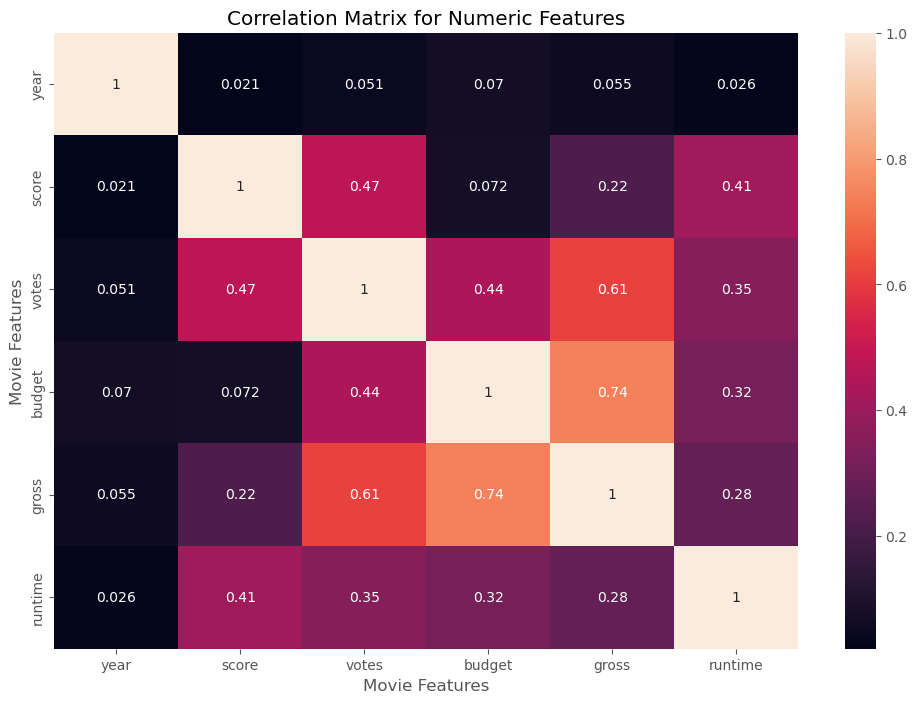

In [97]:
correlation_matrix = df.corr(numeric_only=True,method='pearson')

sns.heatmap(correlation_matrix, annot=True)
plt.title('Correlation Matrix for Numeric Features')
plt.xlabel('Movie Features')
plt.ylabel('Movie Features')

plt.show()

In [111]:
df_numerized = df

for col_name in df_numerized.columns:
    if(df_numerized[col_name].dtype == 'object'):
        df_numerized[col_name] = df_numerized[col_name].astype('category')
        df_numerized[col_name] = df_numerized[col_name].cat.codes

df_numerized

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
0,4692,6,6,1980,1304,8.4,927000.0,1795,2832,699,46,19000000.0,4.699877e+07,1426,146.0
1,3929,6,1,1980,1127,5.8,65000.0,1578,1158,214,47,4500000.0,5.885311e+07,452,104.0
2,3641,4,0,1980,1359,8.7,1200000.0,757,1818,1157,47,18000000.0,5.383751e+08,945,124.0
3,204,4,4,1980,1127,7.7,221000.0,889,1413,1474,47,3500000.0,8.345354e+07,1108,88.0
4,732,6,4,1980,1170,7.3,108000.0,719,351,271,47,6000000.0,3.984634e+07,1083,98.0
5,1509,6,9,1980,1922,6.4,123000.0,1758,3081,155,47,550000.0,3.975460e+07,1108,95.0
6,3930,6,0,1980,1359,7.9,188000.0,974,576,860,47,27000000.0,1.152299e+08,1397,133.0
7,3122,6,3,1980,530,8.2,330000.0,1269,1257,1469,47,18000000.0,2.340243e+07,390,129.0
8,3732,4,0,1981,1346,6.8,101000.0,1606,1402,595,47,54000000.0,1.081857e+08,548,127.0
9,4401,6,3,1980,1755,7.0,10000.0,2011,280,402,47,10000000.0,1.579519e+07,1391,100.0


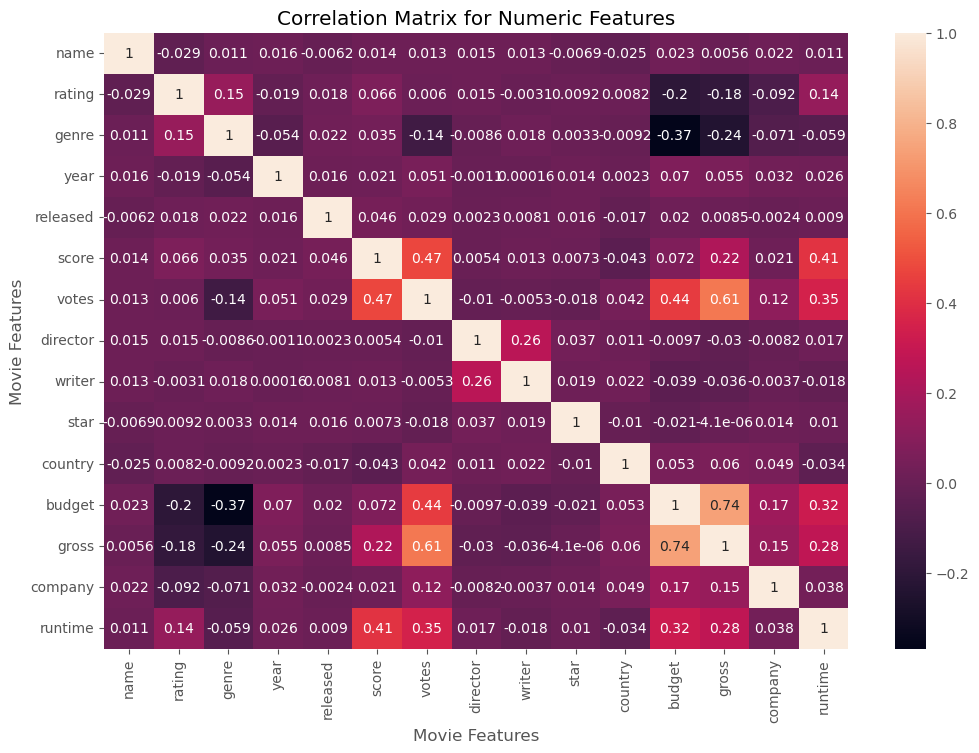

In [99]:
correlation_matrix = df_numerized.corr(method='pearson')
sns.heatmap(correlation_matrix, annot=True)
plt.title('Correlation Matrix for Numeric Features')
plt.xlabel('Movie Features')
plt.ylabel('Movie Features')

plt.show()

In [100]:
df_numerized.corr()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
name,1.000000,-0.029234,0.010996,0.015800,-0.006152,0.014450,0.012615,0.015246,0.012880,-0.006882,-0.025490,0.023392,0.005639,0.021697,0.010850
rating,-0.029234,1.000000,0.147796,-0.019109,0.018083,0.065983,0.006031,0.014656,-0.003149,0.009196,0.008230,-0.203946,-0.181906,-0.092357,0.140792
genre,0.010996,0.147796,1.000000,-0.054332,0.022142,0.035106,-0.135990,-0.008553,0.017578,0.003341,-0.009164,-0.368523,-0.244101,-0.071334,-0.059237
year,0.015800,-0.019109,-0.054332,1.000000,0.015787,0.021325,0.050569,-0.001137,0.000159,0.013677,0.002298,0.070251,0.055369,0.032005,0.025931
released,-0.006152,0.018083,0.022142,0.015787,1.000000,0.045874,0.028833,0.002308,0.008072,0.015706,-0.017228,0.019952,0.008501,-0.002407,0.008975
score,0.014450,0.065983,0.035106,0.021325,0.045874,1.000000,0.474256,0.005413,0.012843,0.007296,-0.043051,0.072001,0.222556,0.020656,0.414068
votes,0.012615,0.006031,-0.135990,0.050569,0.028833,0.474256,1.000000,-0.010376,-0.005316,-0.017638,0.041551,0.439675,0.614751,0.118470,0.352303
director,0.015246,0.014656,-0.008553,-0.001137,0.002308,0.005413,-0.010376,1.000000,0.261735,0.036593,0.011133,-0.009662,-0.029560,-0.008223,0.017433
writer,0.012880,-0.003149,0.017578,0.000159,0.008072,0.012843,-0.005316,0.261735,1.000000,0.018520,0.022488,-0.039466,-0.035885,-0.003697,-0.017561
star,-0.006882,0.009196,0.003341,0.013677,0.015706,0.007296,-0.017638,0.036593,0.018520,1.000000,-0.009990,-0.021473,-0.000004,0.014082,0.010108


In [110]:
correlation_mat = df_numerized.corr()

corr_pairs = correlation_mat.unstack()

corr_pairs

name      name        1.000000
          rating     -0.029234
          genre       0.010996
          year        0.015800
          released   -0.006152
          score       0.014450
          votes       0.012615
          director    0.015246
          writer      0.012880
          star       -0.006882
          country    -0.025490
          budget      0.023392
          gross       0.005639
          company     0.021697
          runtime     0.010850
rating    name       -0.029234
          rating      1.000000
          genre       0.147796
          year       -0.019109
          released    0.018083
          score       0.065983
          votes       0.006031
          director    0.014656
          writer     -0.003149
          star        0.009196
          country     0.008230
          budget     -0.203946
          gross      -0.181906
          company    -0.092357
          runtime     0.140792
genre     name        0.010996
          rating      0.147796
        

In [109]:
sorted_pairs = corr_pairs.sort_values()

sorted_pairs

genre     budget     -0.368523
budget    genre      -0.368523
gross     genre      -0.244101
genre     gross      -0.244101
rating    budget     -0.203946
budget    rating     -0.203946
rating    gross      -0.181906
gross     rating     -0.181906
genre     votes      -0.135990
votes     genre      -0.135990
rating    company    -0.092357
company   rating     -0.092357
          genre      -0.071334
genre     company    -0.071334
          runtime    -0.059237
runtime   genre      -0.059237
genre     year       -0.054332
year      genre      -0.054332
country   score      -0.043051
score     country    -0.043051
budget    writer     -0.039466
writer    budget     -0.039466
          gross      -0.035885
gross     writer     -0.035885
runtime   country    -0.034477
country   runtime    -0.034477
gross     director   -0.029560
director  gross      -0.029560
rating    name       -0.029234
name      rating     -0.029234
          country    -0.025490
country   name       -0.025490
star    

In [103]:
high_corr = sorted_pairs[(sorted_pairs) > 0.5]
high_corr 

gross     votes       0.614751
votes     gross       0.614751
gross     budget      0.740247
budget    gross       0.740247
name      name        1.000000
director  director    1.000000
gross     gross       1.000000
budget    budget      1.000000
country   country     1.000000
star      star        1.000000
writer    writer      1.000000
votes     votes       1.000000
score     score       1.000000
released  released    1.000000
year      year        1.000000
genre     genre       1.000000
rating    rating      1.000000
company   company     1.000000
runtime   runtime     1.000000
dtype: float64

# Conclusion
This project explored a movie dataset through data cleaning, feature correction, and correlation analysis. Key findings include:

There is a strong positive correlation between a movie's budget and its gross revenue, indicating that higher production investment often leads to greater financial return.

Votes (a proxy for popularity or viewer engagement) also show a moderate correlation with gross, suggesting that audience size is a meaningful contributor to box office performance.

After numerizing categorical features (such as genre, company, and country), we observed that most categorical attributes had weaker or minimal correlations with revenue, highlighting the dominant influence of numeric variables.

Data cleaning steps — such as fixing mismatched years and removing incomplete rows — were essential to ensure analytical accuracy and avoid misleading insights.

Overall, this correlation analysis provides a foundation for further work such as predictive modeling, feature engineering, or deeper exploration into what drives movie success.